In [1]:
# Import the requisite packages
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
from census import Census # will need to be installed into your environment using conda install census
from us import states # will need to be installed into your environment using pip install us

In [2]:
# Set API key
#c = Census("CENSUS API KEY HERE")
c = Census("d3b91405dec29fb1f2d1b70b1fe6a628fa470c70")

In [3]:
# Grabbing a few variables of interest pertaining to the economic vitality of an area
geo_demo = [
    "B01003_001E", #"Total Population"
    "B25077_001E", #"Median value of owner occupied units"
    "B25026_001E", #"Total population in occupied housing units"
    "B25008_002E", #"Total number of owner occupied units"
    "B25008_003E", #"Total number of renter occupied units"
    "B06009_002E", #"Population with less than a high school diploma"
    "B06009_003E", #"Population with high school diploma or equivalent"
    "B06009_004E", #"Population with some college/associates degree"
    "B06009_005E", #"Population with bachelors degree"
    "B06009_006E", #"Population with a graduate degree"
    "B05002_013E", #"Foreign born population"
    "B02001_002E", #"Population that is white"
    "B01002_001E", #"Median age"
    "B06010_004E", #"Population with income less than 9999"
    "B06010_005E", #"Population with income between 10000 and 14999"
    "B06010_006E", #"Population with income between 15000 and 24999"
    "B06010_007E", #"Population with income between 25000 and 34999"
    "B06010_008E", #"Population with income between 35000 and 49999"
    "B06010_009E", #"Population with income between 50000 and 64999"
    "B06010_010E", #"Population with income between 65000 and 74999"
    "B06010_011E", #"Population with income of 75000 or more"
    "B28007_009E", #"Population in labor force and unemployed"
    "B19059_002E", #"Population that is retired with retirement income"
    "B19059_003E", #"Retired without retirement income"
    "B08013_001E", #"Travel time to work in minutes"
    "B17013_002E" #"Population with income below poverty level in past 12 months"
        ]

In [4]:
# Sources: https://api.census.gov/data/2019/acs/acs5/variables.html; https://pypi.org/project/census/
ny_census = c.acs5.state_county_tract(fields = ('NAME', 'B01003_001E','B25026_001E','B25008_002E','B25008_003E',
                                               'B25077_001E','B06009_002E','B06009_003E','B06009_004E',
                                               'B06009_005E','B06009_006E','B05002_013E','B02001_002E',
                                               'B01002_001E','B06010_004E','B06010_005E','B06010_006E',
                                               'B06010_007E','B06010_008E','B06010_009E','B06010_010E',
                                               'B06010_011E','B28007_009E','B19059_002E','B19059_003E',
                                               'B08013_001E','B17013_002E'),
                                      state_fips = states.NY.fips,
                                      county_fips = "*",
                                      tract = "*",
                                      year = 2019)

In [6]:
# Create a dataframe from the census data
ny_df = pd.DataFrame(ny_census)

# Show the dataframe and its print its shape
print(ny_df.head(2))
print('Shape of NY DataFrame:', ny_df.shape)

                                            NAME  B01003_001E  B25026_001E  \
0     Census Tract 55, Onondaga County, New York       3563.0       3558.0   
1  Census Tract 56.01, Onondaga County, New York       1599.0       1591.0   

   B25008_002E  B25008_003E  B25077_001E  B06009_002E  B06009_003E  \
0        476.0       3082.0      92600.0        131.0        519.0   
1       1246.0        345.0     147000.0         37.0        116.0   

   B06009_004E  B06009_005E  ...  B06010_010E  B06010_011E  B28007_009E  \
0        697.0        350.0  ...         46.0        152.0        166.0   
1        242.0        260.0  ...         75.0        221.0         30.0   

   B19059_002E  B19059_003E  B08013_001E  B17013_002E  state  county   tract  
0        167.0       1653.0      28685.0        267.0     36     067  005500  
1        102.0        592.0      14155.0          0.0     36     067  005601  

[2 rows x 30 columns]
Shape of NY DataFrame: (4918, 30)


In [10]:
# Access shapefile of NY census tracts
ny_tract = gpd.read_file("https://www2.census.gov/geo/tiger/TIGER2019/TRACT/tl_2019_36_tract.zip")

# Reprojecting the shapefile to the New York State Plan Long Island Zone 
# EPSG:2263 - https://spatialreference.org/ref/epsg/2263/
ny_tract = ny_tract.to_crs(epsg = 2263)

# Print GeoDataFrame of the NY census tract shapefile
print(ny_tract.head(2))
print('NY Tract Shape: ', ny_tract.shape)

# Check projection of the shapefile
print("\nThe shapefile projection for this data is: {}".format(ny_tract.crs))

  STATEFP COUNTYFP TRACTCE        GEOID NAME          NAMELSAD  MTFCC  \
0      36      081  044800  36081044800  448  Census Tract 448  G5020   
1      36      081  045800  36081045800  458  Census Tract 458  G5020   

  FUNCSTAT   ALAND  AWATER     INTPTLAT      INTPTLON  \
0        S  208002       0  +40.7110219  -073.8026344   
1        S  245281       0  +40.7152626  -073.7909261   

                                            geometry  
0  POLYGON ((1037906.015 198756.977, 1038155.154 ...  
1  POLYGON ((1041458.867 199407.403, 1041462.891 ...  
NY Tract Shape:  (4918, 13)

The shapefile projection for this data is: epsg:2263


In [12]:
# Combine the state, county, and tract variables of the ny_df together to create 
# a new string and assign to variable called GEOID

ny_df["GEOID"] = ny_df["state"] + ny_df["county"] + ny_df["tract"]

# Remove the individual columns as they're no longer needed
ny_df = ny_df.drop(columns = ["state", "county", "tract"])

# Display the updated dataframe
ny_df.head(2)

,NAME,B01003_001E,B25026_001E,B25008_002E,B25008_003E,B25077_001E,B06009_002E,B06009_003E,B06009_004E,B06009_005E,...,B06010_008E,B06010_009E,B06010_010E,B06010_011E,B28007_009E,B19059_002E,B19059_003E,B08013_001E,B17013_002E,GEOID
0,"Census Tract 55, Onondaga County, New York",3563.0,3558.0,476.0,3082.0,92600.0,131.0,519.0,697.0,350.0,...,401.0,156.0,46.0,152.0,166.0,167.0,1653.0,28685.0,267.0,36067005500
1,"Census Tract 56.01, Onondaga County, New York",1599.0,1591.0,1246.0,345.0,147000.0,37.0,116.0,242.0,260.0,...,240.0,246.0,75.0,221.0,30.0,102.0,592.0,14155.0,0.0,36067005601


In [15]:
# Join the data together on GEOID to geoenable the census data
ny_merge = ny_tract.merge(ny_df, on = "GEOID")

# Display the results
ny_merge.head(2)

,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,B06010_007E,B06010_008E,B06010_009E,B06010_010E,B06010_011E,B28007_009E,B19059_002E,B19059_003E,B08013_001E,B17013_002E
0,36,081,044800,36081044800,448,Census Tract 448,G5020,S,208002,0,...,234.0,104.0,247.0,54.0,234.0,104.0,64.0,666.0,54320.0,117.0
1,36,081,045800,36081045800,458,Census Tract 458,G5020,S,245281,0,...,187.0,167.0,158.0,79.0,325.0,80.0,61.0,632.0,50275.0,18.0


## 2. Cleaning the Data

In [17]:
# Renaming variables in the data set
ny_merge.rename(columns={
    "B01003_001E":"TotPop", #"Total Population"
    "B25077_001E":"MedVal_OwnOccUnit", #"Median value of owner occupied units"
    "B25026_001E":"TotPopOccUnits", #"Total population in occupied housing units"
    "B25008_002E":"TotNumOwnOccUnit", #"Total number of owner occupied units"
    "B25008_003E":"TotNumRentOccUnit", #"Total number of renter occupied units"
    "B06009_002E":"PopLTHSDip", #"Population with less than a high school diploma"
    "B06009_003E":"PopHSDip", #"Population with high school diploma or equivalent"
    "B06009_004E":"PopAssoc", #"Population with some college/associates degree"
    "B06009_005E":"PopBA", #"Population with bachelors degree"
    "B06009_006E":"PopGrad", #"Population with a graduate degree"
    "B05002_013E":"PopFrgnBorn", #"Foreign born population"
    "B02001_002E":"WhitePop", #"Population that is white"
    "B01002_001E":"MedAge", #"Median age"
    "B06010_004E":"PopIncLT10", #"Population with income less than 9999"
    "B06010_005E":"PopInc1015", #"Population with income between 10000 and 14999"
    "B06010_006E":"PopInc1525", #"Population with income between 15000 and 24999"
    "B06010_007E":"PopInc2535", #"Population with income between 25000 and 34999"
    "B06010_008E":"PopInc3550", #"Population with income between 35000 and 49999"
    "B06010_009E":"PopInc5065", #"Population with income between 50000 and 64999"
    "B06010_010E":"PopInc6575", #"Population with income between 65000 and 74999"
    "B06010_011E":"PopIncGT75", #"Population with income of 75000 or more"
    "B28007_009E":"UnempPop", #"Population in labor force and unemployed"
    "B19059_002E":"RetPop", #"Population that is retired with retirement income"
    "B19059_003E":"RetPopNoRetInc", #"Retired without retirement income"
    "B08013_001E":"TrvTimWrk", #"Travel time to work in minutes"
    "B17013_002E":"PopBlwPovLvl" #"Population with income below poverty level in past 12 months"
}
                , inplace=True
               )

In [20]:
geo_demo_rn = [
"TotPop", #"Total Population"
"TotPopOccUnits", #"Total population in occupied housing units"
"TotNumOwnOccUnit", #"Total number of owner occupied units"
"TotNumRentOccUnit", #"Total number of renter occupied units"
"PopLTHSDip", #"Population with less than a high school diploma"
"PopHSDip", #"Population with high school diploma or equivalent"
"PopAssoc", #"Population with some college/associates degree"
"PopBA", #"Population with bachelors degree"
"PopGrad", #"Population with a graduate degree"
"PopFrgnBorn", #"Foreign born population"
"WhitePop", #"Population that is white"
"PopIncLT10", #"Population with income less than 9999"
"PopInc1015", #"Population with income between 10000 and 14999"
"PopInc1525", #"Population with income between 15000 and 24999"
"PopInc2535", #"Population with income between 25000 and 34999"
"PopInc3550", #"Population with income between 35000 and 49999"
"PopInc5065", #"Population with income between 50000 and 64999"
"PopInc6575", #"Population with income between 65000 and 74999"
"PopIncGT75", #"Population with income of 75000 or more"
"UnempPop", #"Population in labor force and unemployed"
"RetPop", #"Population that is retired with retirement income"
"RetPopNoRetInc", #"Retired without retirement income"
"PopBlwPovLvl" #"Population with income below poverty level in past 12 months"
]

# Cleaning up the dataframe
geo_demo_rn.append('geometry')
ny_merge_2 = ny_merge[geo_demo_rn]
geo_demo_rn.remove('geometry')

In [21]:
# Dropping any areas without population
ny_merge_2 = ny_merge_2[ny_merge_2['TotPop']>0]

# Resetting the index to assist in index based operations later on
ny_merge_2.reset_index(inplace=True)

## 3. Exploratory Data Analysis

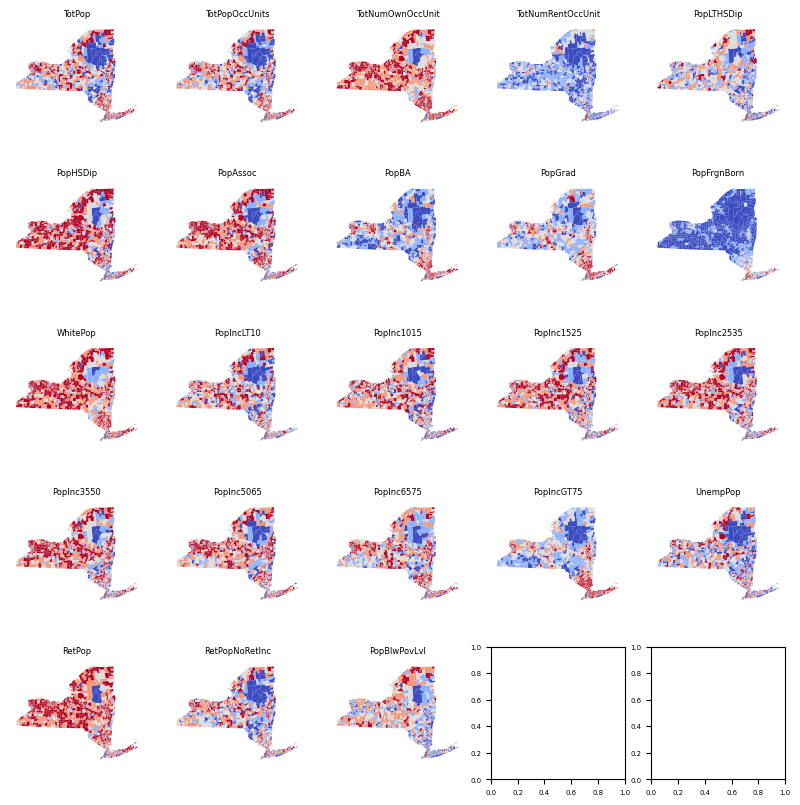

In [29]:
# Setting up the figure using subplots to map each of the extracted variables
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(10,10))

axes = axes.flatten()

# Setting the fontsize
plt.rcParams['font.size'] = '5'

# Plotting each of the extracted variables in a subplot
for ind, col in enumerate(geo_demo_rn):
    ax = axes[ind]
    ny_merge_2.plot(column=col,
                  ax = ax,
                  scheme = "quantiles",
                  linewidth=0,
                  cmap="coolwarm",
                 )
    
    ax.set_axis_off()
    ax.set_title(col)
    
plt.show()

In [30]:
# Importing packages required for testing spatial autocorrelation
from libpysal.weights import Queen, KNN
from esda.moran import Moran
import numpy as np

# Testing for spatial auto correlation using Moran's I
# First, we need to set up the spatial weights matrix
w = Queen.from_dataframe(ny_merge_2)

C:\Users\imdav\Anaconda3\envs\GeospatialPython\lib\site-packages\libpysal\weights\weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
 There is 1 island with id: 296.
  warnings.warn(message)


In [41]:
# Set the numpy random seed for reproducibility
np.random.seed(54321)

# Calculate the Moran's I statistic for each geodemographic variable
moransi_results = [
    Moran(ny_merge_2[v], w) for v in geo_demo_rn
]

# Structure results as a list of tuples
moransi_results = [
    (v, res.I, res.p_sim)
    for v, res in zip(geo_demo_rn, moransi_results)
]

# Display as a table
table = pd.DataFrame(
    moransi_results, columns=["GEODEMO Var", "Moran's I", "P-value"]
).set_index("GEODEMO Var")

table.head(5)

,Moran's I,P-value
GEODEMO Var,,
TotPop,0.293936,0.001
TotPopOccUnits,0.285091,0.001
TotNumOwnOccUnit,0.577288,0.001
TotNumRentOccUnit,0.544159,0.001
PopLTHSDip,0.504985,0.001


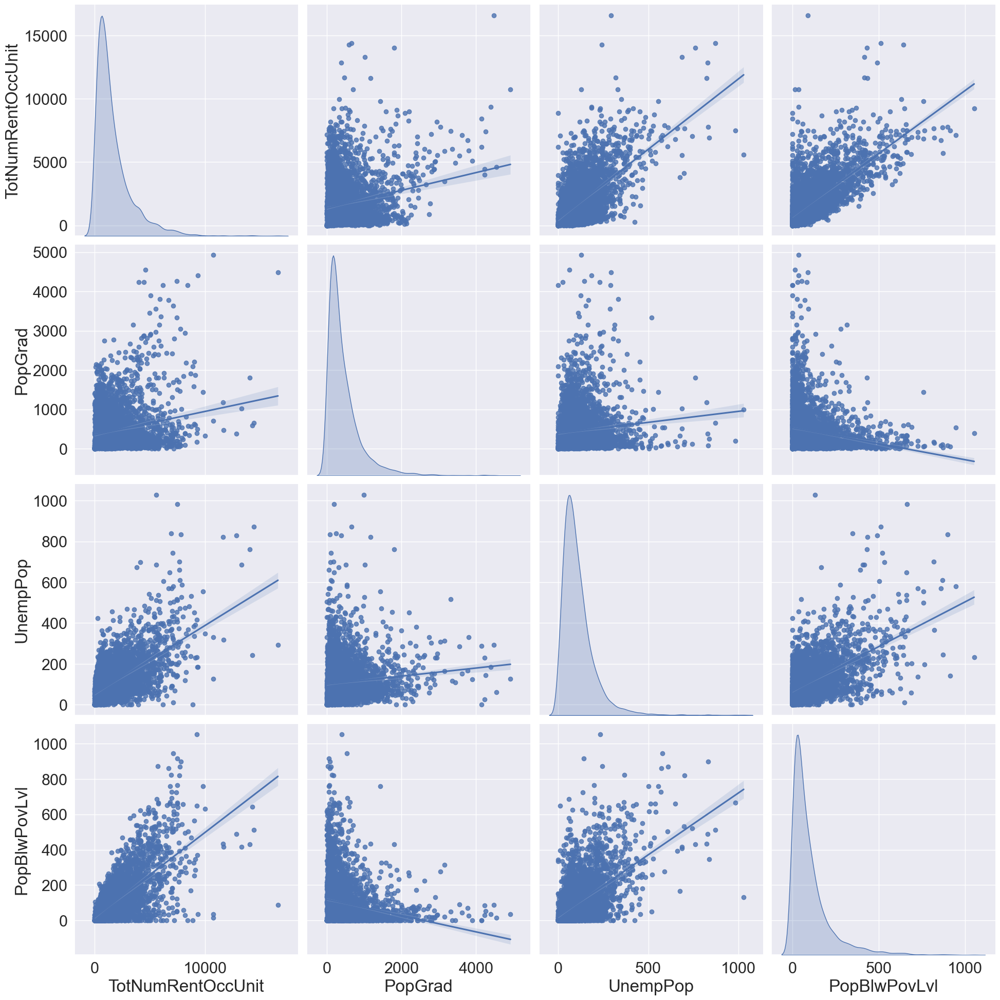

In [56]:
# Importing packages required for additional visualization
import seaborn as sns
sns.set(font_scale=2)

# Given we have 25 variables in the data set to explore, this will be way to many plots to visually inspect. Lets inspect just a handful
sel_vars = [
    "TotNumRentOccUnit", #"Total number of renter occupied units"
    "PopGrad", #"Population with a graduate degree"
    "UnempPop", #"Population in labor force and unemployed"
    "PopBlwPovLvl" #"Population with income below poverty level in past 12 months"
]

pplt = sns.pairplot(
    ny_merge_2[sel_vars], kind="reg", diag_kind="kde",
    height=5, 
)

plt.show()

In [57]:
# Saving out the figure as an image
fig = pplt.fig
fig.savefig("NY_Pairplot.png")

C:\Users\imdav\AppData\Local\Temp\ipykernel_15272\4186096044.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.triu(np.ones_like(ny_merge_2.corr(), dtype=np.bool))


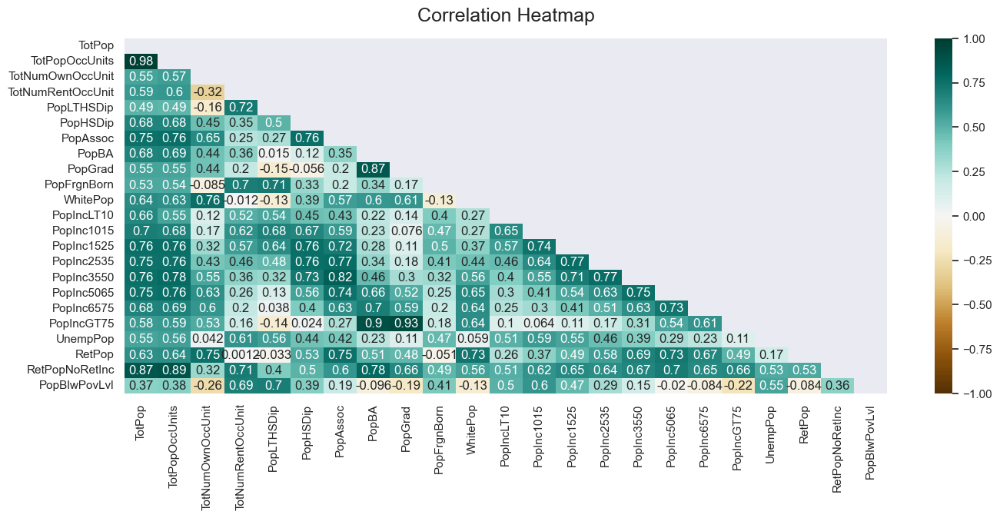

In [72]:
# More condensed way to visualize correlations via a heat map
plt.figure(figsize=(16, 6))

# define the mask to set the values in the upper triangle to True
mask = np.triu(np.ones_like(ny_merge_2.corr(), dtype=np.bool))
heatmap = sns.heatmap(ny_merge_2.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=16);

## 4. Processing the data

In [81]:
# Importing the packages needed to scale the data
from sklearn.preprocessing import robust_scale

ny_merged_scaled = robust_scale(ny_merge_2[geo_demo_rn])
ny_merged_scaled

array([[-0.39215283, -0.3604928 , -0.33381359, ..., -0.69708029,
        -0.59383378,  0.54455446],
       [-0.581553  , -0.55140284, -0.30233847, ..., -0.7080292 ,
        -0.63941019, -0.43564356],
       [ 1.29149548,  1.14483901, -0.16446858, ...,  0.2189781 ,
         0.87801609,  0.47524752],
       ...,
       [ 0.51335251,  0.55223108, -0.14185969, ...,  0.22992701,
         1.00268097,  0.91089109],
       [-0.76807724, -0.73941402, -0.25579076, ..., -0.54744526,
        -0.91957105, -0.32673267],
       [ 0.16536565,  0.20147013,  0.55369611, ..., -0.02919708,
        -0.22386059, -0.22772277]])

## 5. Modeling

### 5.1 KMeans

In [83]:
# Exploring an initial k-means baseline model 
from sklearn.cluster import KMeans

# setting the random seed to ensure reproducibility 
np.random.seed(54321)

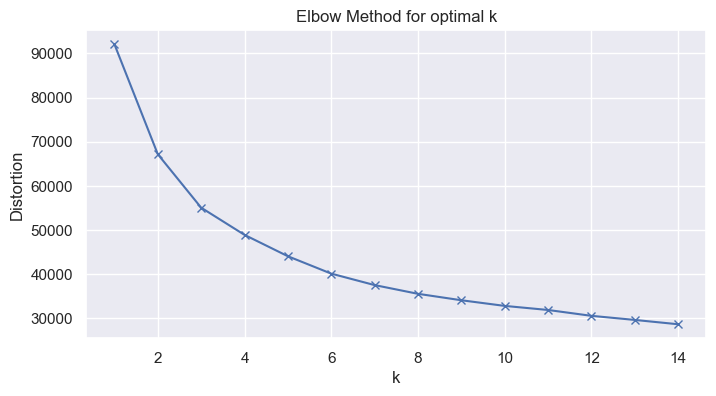

In [86]:
distortions = []
K = range(1,15)
for k in K:
    # Instantiating the model
    kmeans=KMeans(n_clusters=k)
    kmeans.fit(ny_merged_scaled)
    distortions.append(kmeans.inertia_)

plt.figure(figsize=(8,4))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('Elbow Method for optimal k')
plt.show()

In [87]:
# Running the KMeans model with 6 clusters
kmeans=KMeans(n_clusters=6)
km_6 = kmeans.fit(ny_merged_scaled)

# Printing the cluster labels
km_6.labels_

array([5, 5, 3, ..., 0, 5, 4])

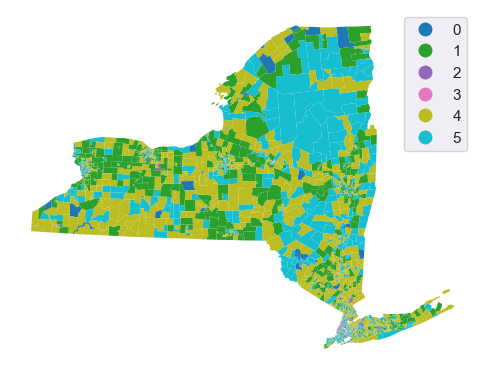

In [88]:
# Assign labels to a new column called km_6_label
ny_merge_2["km_6_label"] = km_6.labels_

# Setup figure and axis
f, ax = plt.subplots(1, figsize=(6, 6))

# Plot the choropleth map
ny_merge_2.plot(
    column="km_6_label", categorical=True, legend=True, linewidth=0, ax=ax
)

# Remove the axis
ax.set_axis_off()

# Display the map
plt.show()

In [96]:
# Group data table by cluster label and count observations
k6distr = ny_merge_2.groupby("km_6_label").size()
k6distr

km_6_label
0     876
1     646
2     124
3     230
4    1289
5    1689
dtype: int64

[Axis(name=Easting, abbrev=X, direction=east, unit_auth_code=EPSG, unit_code=9003, unit_name=US survey foot), Axis(name=Northing, abbrev=Y, direction=north, unit_auth_code=EPSG, unit_code=9003, unit_name=US survey foot)]

The area of the clusters is: km_6_label
0     1583.599086
1    12767.169377
2       89.175572
3       44.883692
4    18680.420727
5    16185.590869
Name: area, dtype: float64


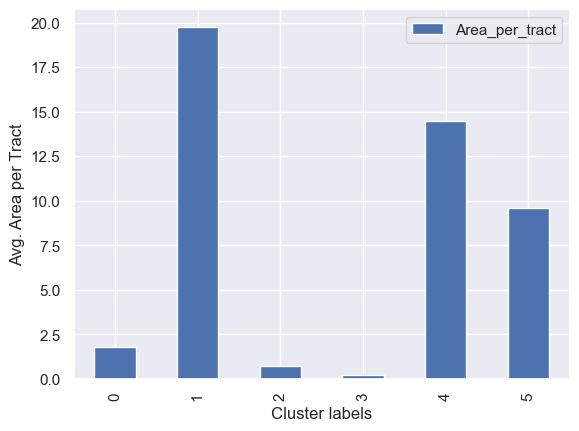

In [110]:
# Getting the unit of measurement from the CRS
print(ny_merge_2.crs.axis_info)

# Calculate the average area of each cluster
# 1. Create a new column with the area of the census tract and convert from foot to sq. mi. 
ny_merge_2['area'] = (ny_merge_2.geometry.area)*3.587E-8

# 2. Dissolve the tracts and caluculate the area
area = ny_merge_2.dissolve(by="km_6_label", aggfunc="sum")["area"]
print("\nThe area of the clusters is: {}".format(area))

# 3. Create a table with the number of tracts per cluster and the sum area
tract_area = pd.DataFrame({"No. Tracts": k6distr, "Area": area})
tract_area['Area_per_tract'] = tract_area["Area"]/tract_area["No. Tracts"]
tract_area.reset_index(inplace=True)

# 4. Plot the area per tract
ax = tract_area.plot.bar(x="km_6_label",y="Area_per_tract")

# Rename axes
ax.set_xlabel("Cluster labels")
ax.set_ylabel("Avg. Area per Tract");

In [122]:
# Calculating descriptive statistics for each cluster
k6means = ny_merge_2.groupby("km_6_label")[geo_demo_rn].mean()

# Transpose the table and rounding the values to 2 decimal places
k6means.round(2)

,TotPop,TotPopOccUnits,TotNumOwnOccUnit,TotNumRentOccUnit,PopLTHSDip,PopHSDip,PopAssoc,PopBA,PopGrad,PopFrgnBorn,...,PopInc1525,PopInc2535,PopInc3550,PopInc5065,PopInc6575,PopIncGT75,UnempPop,RetPop,RetPopNoRetInc,PopBlwPovLvl
km_6_label,,,,,,,,,,,,,,,,,,,,,
0,4319.41,4182.03,1338.76,2843.27,640.77,846.41,649.41,439.14,245.02,1489.39,...,494.48,373.17,369.87,254.74,93.05,314.35,148.34,198.50,1310.23,189.89
1,6291.84,6162.60,4756.43,1406.17,371.39,1227.70,1257.11,912.12,713.59,863.03,...,622.43,552.22,652.89,543.75,242.67,1014.00,137.15,605.89,1769.63,85.68
2,7511.65,7329.69,2776.48,4553.22,218.06,433.31,631.89,2295.02,2359.81,1752.73,...,419.09,351.86,473.65,551.15,289.10,3104.58,166.80,505.75,3291.14,54.90
3,7501.20,7357.23,1094.93,6262.30,1475.29,1377.76,1075.58,721.63,376.22,3015.98,...,882.79,640.57,594.31,385.73,152.75,446.08,323.69,307.53,2334.14,404.31
4,4116.21,4025.27,3031.24,994.04,213.92,709.60,740.60,681.52,598.33,575.74,...,375.36,326.02,396.62,347.10,153.21,798.18,88.60,375.69,1210.75,49.78
5,2227.04,2111.25,1236.02,875.23,209.16,427.14,383.02,294.21,213.09,535.40,...,226.78,184.78,205.13,160.93,65.28,288.48,60.72,159.47,647.92,55.83


In [144]:
# Creating a dataframe version of the scaled data
ny_merged_scaled_df = pd.DataFrame(ny_merged_scaled,
                  columns = geo_demo_rn)

# Adding in the cluster labels
ny_merged_scaled_df["km_6_label"] = km_6.labels_

# Calculating descriptive statistics for each cluster
k6means_s = ny_merged_scaled_df.groupby("km_6_label")[geo_demo_rn].mean()

# Transpose the table and rounding the values to 2 decimal places
k6means_s.round(2)

import plotly.graph_objects as go # Plotly needs to be installed in your environment utilizing conda.
from IPython.display import HTML

categories = k6means_s.columns
fig = go.Figure()

for g in k6means_s.index:
    fig.add_trace(go.Scatterpolar(
        r = k6means_s.loc[g].values,
        theta = categories,
        fill = 'toself',
        name = f'cluster #{g}'
    ))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[-2, 5] # here we can define the range
    )),
  showlegend=True,
    title="Cluster Radial Plot",
    title_x=0.5
)

HTML(fig.to_html())

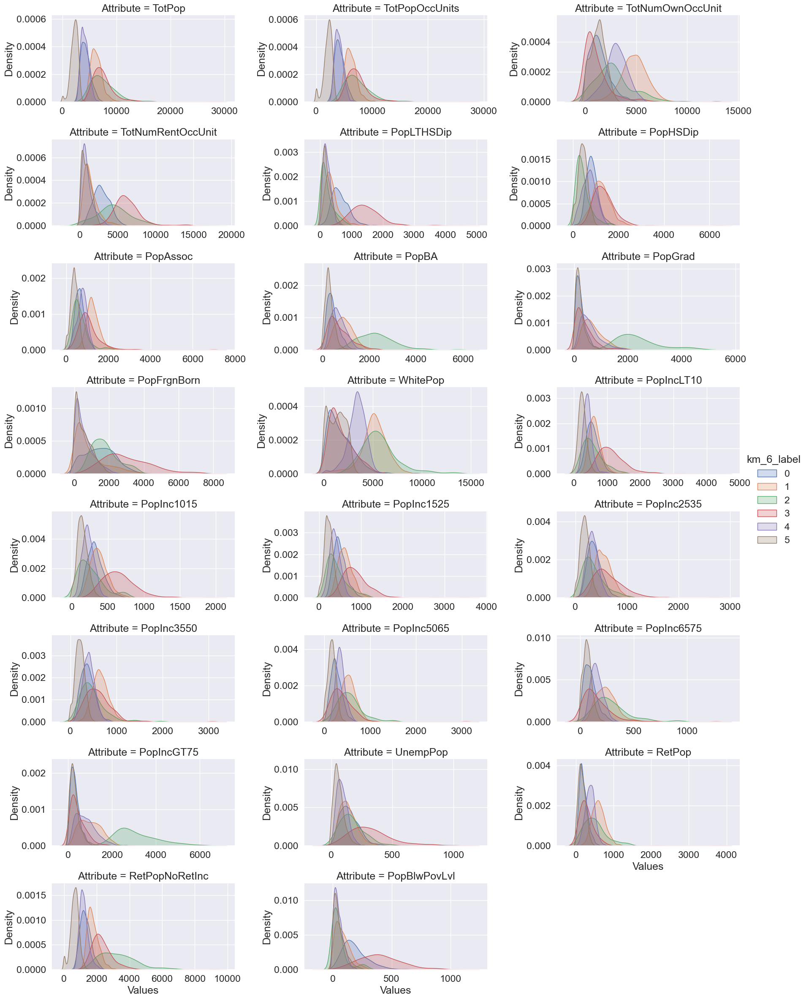

In [113]:
# Scale fonts to make them more readable
sns.set(font_scale=1.5)
# Setup the facets
facets = sns.FacetGrid(
    data=tidy_df,
    col="Attribute",
    hue="km_6_label",
    sharey=False,
    sharex=False,
    aspect=2,
    col_wrap=3,
)
# Build the plot from `sns.kdeplot`
_ = facets.map(sns.kdeplot, "Values", fill=True).add_legend()

### 5.2 Hierarchical Clustering w/o Spatial Constraint

In [146]:
# Importing the pakage needed for hierarchical clustering
from sklearn.cluster import AgglomerativeClustering

# Set seed for reproducibility
np.random.seed(54321)

In [147]:
# Instantiate the algorithm
model = AgglomerativeClustering(linkage="ward", n_clusters=6)

# Run clustering
model.fit(ny_merged_scaled)

# Assign labels to main dataframe
ny_merge_2["ward6_label"] = model.labels_

# Assign labels to scaled dataframe
ny_merged_scaled_df["ward6_label"] = model.labels_

In [148]:
ward6sizes = ny_merge_2.groupby("ward6_label").size()
ward6sizes

ward6_label
0    1244
1    1766
2     786
3     816
4      69
5     173
dtype: int64

In [153]:
ward6means_s = ny_merged_scaled_df.groupby("ward6_label")[geo_demo_rn].mean()

# Transpose the table and rounding the values to 2 decimal places
ward6means_s.round(2)

categories = ward6means_s.columns
fig = go.Figure()

for g in ward6means_s.index:
    fig.add_trace(go.Scatterpolar(
        r = ward6means_s.loc[g].values,
        theta = categories,
        fill = 'toself',
        name = f'cluster #{g}'
    ))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[-2, 6] # here we can define the range
    )),
  showlegend=True,
    title="Cluster Radial Plot",
    title_x=0.5
)

HTML(fig.to_html())

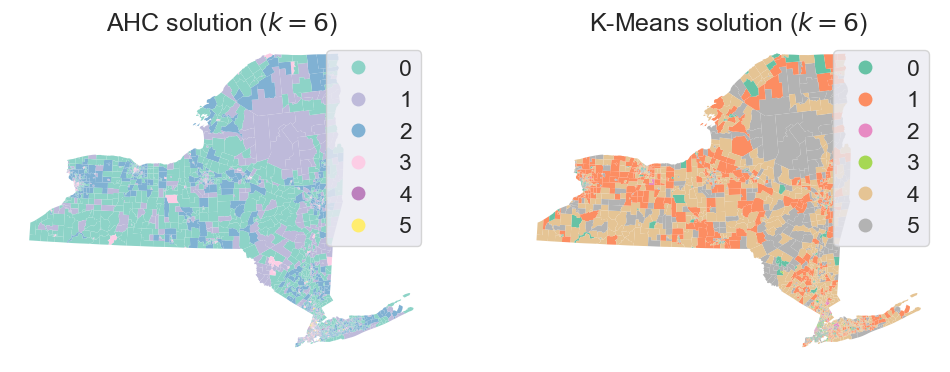

In [155]:
# Setup figure and ax
f, axs = plt.subplots(1, 2, figsize=(12, 6))

### K-Means ###
ax = axs[1]
# Plot the choropleth map of the k-means results
ny_merge_2.plot(
    column="km_6_label",
    categorical=True,
    cmap="Set2",
    legend=True,
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("K-Means solution ($k=6$)")

### AHC ###
ax = axs[0]

# Plot the choropleth map of the AHC results
ny_merge_2.plot(
    column="ward6_label",
    categorical=True,
    cmap="Set3",
    legend=True,
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("AHC solution ($k=6$)")

# Display the map
plt.show()

### 5.3 Hierarchical Clustering w/ Spatial Constraint

In [157]:
# Set the seed for reproducibility
np.random.seed(54321)

# Specify cluster model with spatial constraint
model = AgglomerativeClustering(
    linkage="ward", connectivity=w.sparse, n_clusters=6
)
# Fit algorithm to the data
model.fit(ny_merged_scaled)

# Assign labels to main dataframe
ny_merge_2["ward6w_label"] = model.labels_

# Assign labels to scaled dataframe
ny_merged_scaled_df["ward6w_label"] = model.labels_

C:\Users\imdav\Anaconda3\envs\GeospatialPython\lib\site-packages\sklearn\cluster\_agglomerative.py:279: UserWarning:

the number of connected components of the connectivity matrix is 2 > 1. Completing it to avoid stopping the tree early.



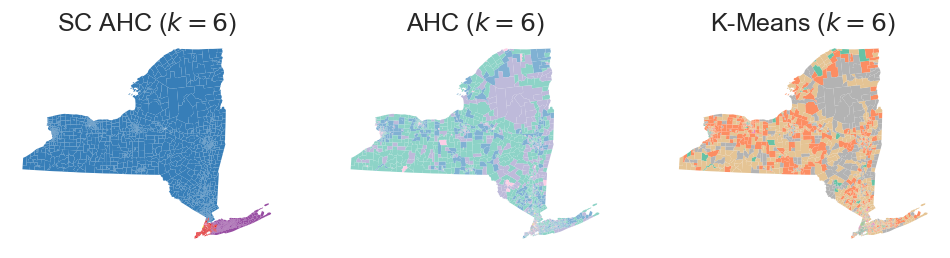

In [166]:
# Setup figure and ax
f, axs = plt.subplots(1, 3, figsize=(12, 6))

### K-Means ###
ax = axs[2]
# Plot the choropleth map of the k-means results
ny_merge_2.plot(
    column="km_6_label",
    categorical=True,
    cmap="Set2",
    legend=False,
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("K-Means ($k=6$)")

### AHC ###
ax = axs[1]

# Plot the choropleth map of the AHC results
ny_merge_2.plot(
    column="ward6_label",
    categorical=True,
    cmap="Set3",
    legend=False,
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("AHC ($k=6$)")


### SC_AHC ###
ax = axs[0]

# Plot the choropleth map of the SC AHC results
ny_merge_2.plot(
    column="ward6w_label",
    categorical=True,
    cmap="Set1",
    legend=False,
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("SC AHC ($k=6$)")

# Display the map
plt.show()

In [167]:
# Changing the spatial constraing using KNN
w = KNN.from_dataframe(ny_merge_2, k=10)

In [168]:
# Set the seed for reproducibility
np.random.seed(54321)

# Specify cluster model with spatial constraint
model = AgglomerativeClustering(
    linkage="ward", connectivity=w.sparse, n_clusters=6
)
# Fit algorithm to the data
model.fit(ny_merged_scaled)

# Assign labels to main dataframe
ny_merge_2["ward6_knnw_label"] = model.labels_

# Assign labels to scaled dataframe
ny_merged_scaled_df["ward6_knnw_label"] = model.labels_

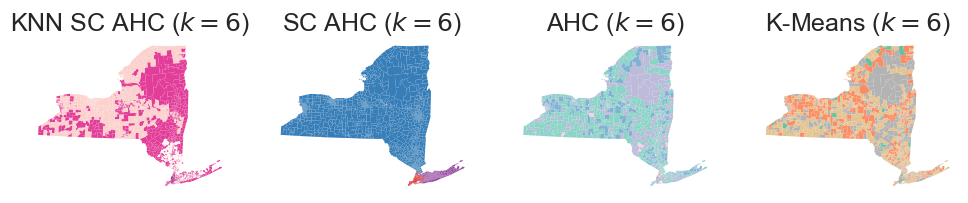

In [172]:
# Setup figure and ax
f, axs = plt.subplots(1, 4, figsize=(12, 6))

### K-Means ###
ax = axs[3]
# Plot the choropleth map of the k-means results
ny_merge_2.plot(
    column="km_6_label",
    categorical=True,
    cmap="Set2",
    legend=False,
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("K-Means ($k=6$)")

### AHC ###
ax = axs[2]

# Plot the choropleth map of the AHC results
ny_merge_2.plot(
    column="ward6_label",
    categorical=True,
    cmap="Set3",
    legend=False,
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("AHC ($k=6$)")


### SC_AHC ###
ax = axs[1]

# Plot the choropleth map of the SC AHC results
ny_merge_2.plot(
    column="ward6w_label",
    categorical=True,
    cmap="Set1",
    legend=False,
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("SC AHC ($k=6$)")

### KNN SC_AHC ###
ax = axs[0]

# Plot the choropleth map of the KNN SC AHC results
ny_merge_2.plot(
    column="ward6_knnw_label",
    categorical=True,
    cmap="RdPu",
    legend=False,
    linewidth=0,
    ax=ax,
)
# Remove the axis
ax.set_axis_off()

# Add the title
ax.set_title("KNN SC AHC ($k=6$)")

# Display the map
plt.show()

## 6. Model Performance

In [184]:
from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score, silhouette_score

ch_scores = []
db_scores = []
s_scores = []

for model in ("km_6_label", "ward6_label", "ward6w_label", "ward6_knnw_label"):
    # compute the CH score
    ch_score = calinski_harabasz_score(
        # using scaled variables
        ny_merged_scaled_df[geo_demo_rn],
        # using these labels
        ny_merged_scaled_df[model],
    )
    # and append the cluster type with the CH score
    ch_scores.append((model, ch_score))
    
    # compute the DB score
    db_score = davies_bouldin_score(
        # using scaled variables
        ny_merged_scaled_df[geo_demo_rn],
        # using these labels
        ny_merged_scaled_df[model],
    )
    # and append the cluster type with the DB score
    db_scores.append((model, db_score))
    
    # compute the silhouette score
    s_score = silhouette_score(
        # using scaled variables
        ny_merged_scaled_df[geo_demo_rn],
        # using these labels
        ny_merged_scaled_df[model],
    )
    # and append the cluster type with the silhouette score
    s_scores.append((model, s_score))

# create a dataframe from the scores
ch_df = pd.DataFrame(
    ch_scores, columns=["model", "CH Score"]
).set_index("model")
db_df = pd.DataFrame(
    db_scores, columns=["model", "DB Score"]
).set_index("model")
s_df = pd.DataFrame(
    s_scores, columns=["model", "Silhouette Score"]
).set_index("model")

# Merging into a combined dataframe
scores_df = ch_df.merge(db_df, on="model")
scores_df = scores_df.merge(s_df, on="model")

# displaying the dataframe
scores_df

,CH Score,DB Score,Silhouette Score
model,,,
km_6_label,1253.654197,1.385374,0.217206
ward6_label,1056.791450,1.550270,0.182697
ward6w_label,224.953345,2.819006,0.010842
ward6_knnw_label,535.342853,2.257614,0.137818
